# **Predicting the Sex of Abalone**

### Group 26: Joontae (Jay) Kim, Elisabeth Lau, Patricia Zhang, Jimmy Qi

## **Introduction**

Recently, the overexploitation of abalone has prompted strict regulations to ensure sustainability (Bullon et al., 2023). Analyzing abalone data can help evaluate the recovery potential of abalone populations (Boles et al., 2023), underscoring the critical role of understanding population dynamics through sex classification for effective conservation strategies.


We are using the Abalone dataset, originally created by Warwick Nash, Tracy Sellers, Simon Talbot, Andrew Cawthorn, and Wes Ford, from <a href = "https://doi.org/10.24432/C55C7W">UC Irvine’s Machine Learning Repository</a>. It includes variables of sex, length, diameter, height, number of rings, and the whole, shucked, viscera, and shell weight. The dataset has no missing values and includes the observation’s role(feature/target), type(continuous/integer) and description. This dataset also uses a tabular delimiter, allowing tasks such as classification and regression to answer our question.
to the abalone habitat (Nash et al., 1995).

The question we are addressing is: **How can we use the size measurements, particularly length, diameter, height, and total weight, to help us effectively predict the sex of abalone?**

## **Preliminary exploratory data analysis**

In [2]:
#Import packages that we will use
library(tidyverse)
library(cowplot)
library(scales)
library(GGally)
library(ggplot2)
library(tidymodels)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Warning message:
“package ‘cowplot’ was built under R version 4.3.2”

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor


Warning message:
“package ‘GGally’ was built under R version 4.3.2

In [3]:
#Download and import the table using URL
set.seed(1)
url <- "https://raw.githubusercontent.com/werehappy/DSCI-Group-Project-26-/main/data/abalone.data"
download.file(url, "abalone_data.csv")
abalone_data <- read_delim("abalone_data.csv", delim = ",") #since there are no missing values, no need to remove with na.rm

Rows: 4176 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): M
dbl (8): 0.455, 0.365, 0.095, 0.514, 0.2245, 0.101, 0.15, 15

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [7]:
#Cleaning and wrangling data

#1. Add column names to the table
colnames(abalone_data) <- c("Sex", "Length", "Diameter", 
                      "Height", "Whole_weight", "Shucked_weight", "Visera_weight", "Shell_weight", "Rings")

#2. Filter out unwanted variables and factorise Sex column
abalone_filtered_fct <- abalone_data |> mutate(Sex = as_factor(Sex)) |> 
mutate(Sex = fct_recode(Sex, "Male" = "M", "Female" = "F", "Infant" = "I")) |> select(Sex:Whole_weight)
print("Table 1: Cleaned and Wrangled Data")
head(abalone_filtered_fct)

[1] "Table 1: Cleaned and Wrangled Data"


Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.350,0.265,0.090,0.2255
Female,0.530,0.420,0.135,0.6770
Male,0.440,0.365,0.125,0.5160
Infant,0.330,0.255,0.080,0.2050
Infant,0.425,0.300,0.095,0.3515
Female,0.530,0.415,0.150,0.7775


In [8]:
#Splitting the table with 75% of training and 25% of testing
abalone_split <- initial_split(abalone_filtered_fct, prop = 0.75, strata = Sex)
abalone_train <- training(abalone_split) 
abalone_test <- testing(abalone_split)

print("Table 2: Training Data")
head(abalone_train)

[1] "Table 2: Training Data"


Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Female,0.530,0.420,0.135,0.6770
Female,0.545,0.425,0.125,0.7680
Female,0.550,0.440,0.150,0.8945
Female,0.535,0.405,0.145,0.6845
Female,0.470,0.355,0.100,0.4755
Female,0.550,0.415,0.135,0.7635


### Visualizing the training data


As seen by the boxplots and area graphs, females seem to have slightly larger physical characteristics than males and visibly more than infants across plots. This shows the relationship between the abalone sex and chosen physical features that we will use for predicting sex.

**Note**: The scatterplots are least useful in visualizing the differences between the categorical points because the numerous overlapping points are difficult to read. The histograms are also difficult to compare between classes.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


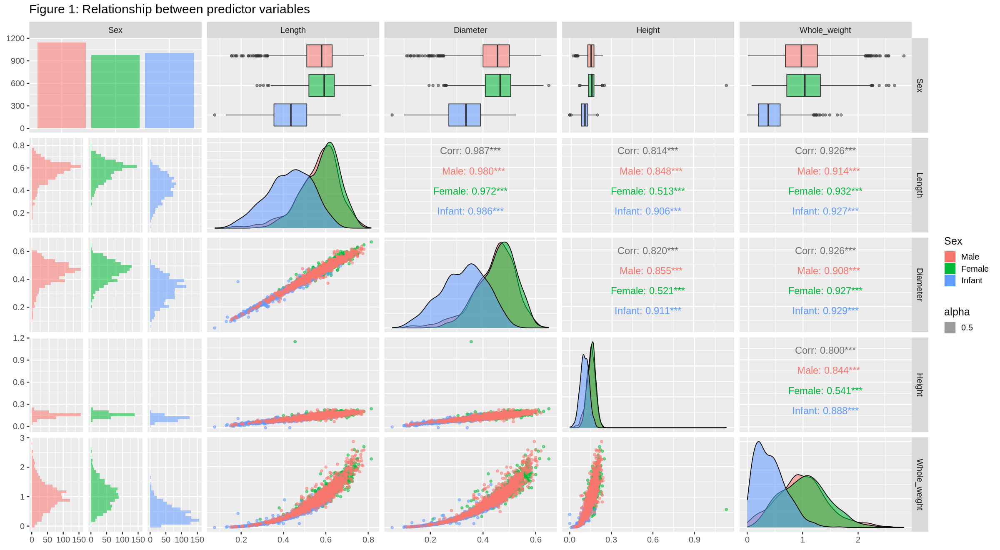

In [6]:
#Visualise the relationship between each of our predictor variables in the training data using the ggpairs function
options(repr.plot.width = 20, repr.plot.height = 11)
ggpairs(abalone_train, 
        columns = 1:5, 
        ggplot2::aes(color = Sex , alpha = 0.5),
        legend = 1,
        upper = list(continuous = wrap("cor", size = 5)),
        labs(fill = "Sex")) + 
    ggtitle("Figure 1: Relationship between predictor variables") +
    theme(title = element_text(size = 15)) +
    theme_grey(base_size = 15)

### Summarizing the training data

In [9]:
#Summarising the total number of observations for each class (sex - male, female, infant)
abalone_proportions <- abalone_train |>
                      group_by(Sex) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(abalone_train))
print("Table 3: Total number of observations for each class")
abalone_proportions

[1] "Table 3: Total number of observations for each class"


Sex,n,percent
<fct>,<int>,<dbl>
Male,1145,36.56979
Female,980,31.29990
Infant,1006,32.13031


In [10]:
#Summarising mean, median, and range of length predictor variable
length_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_length = mean(Length), median_length = median(Length), min_length = min(Length), max_length = max(Length))
print("Table 4: Summary of length for each class")
length_summary

[1] "Table 4: Summary of length for each class"


Sex,mean_length,median_length,min_length,max_length
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.5610873,0.580,0.155,0.780
Female,0.5806480,0.595,0.275,0.800
Infant,0.4264960,0.435,0.075,0.725


In [11]:
#Summarising mean, median, and range of diameter predictor variable
diameter_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_diameter = mean(Diameter), median_diameter = median(Diameter), min_diameter = min(Diameter), max_diameter = max(Diameter))
print("Table 5: Summary of diameter for each class")
diameter_summary

[1] "Table 5: Summary of diameter for each class"


Sex,mean_diameter,median_diameter,min_diameter,max_diameter
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.4390480,0.455,0.115,0.63
Female,0.4559337,0.465,0.195,0.63
Infant,0.3255964,0.335,0.055,0.55


In [12]:
#Summarising mean, median, and range of height predictor variable
height_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_height = mean(Height), median_height = median(Height), min_height = min(Height), max_height = max(Height))
print("Table 6: Summary of height for each class")
height_summary

[1] "Table 6: Summary of height for each class"


Sex,mean_height,median_height,min_height,max_height
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.1510611,0.155,0.025,0.515
Female,0.1575867,0.160,0.015,0.250
Infant,0.1077435,0.110,0.000,0.220


In [13]:
#Summarising mean, median, and range of weight predictor variable
weight_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_weight = mean(Whole_weight), median_height = median(Whole_weight), min_weight = min(Whole_weight), max_weight = max(Whole_weight))
print("Table 7: Summary of height for each class")
weight_summary

[1] "Table 7: Summary of height for each class"


Sex,mean_weight,median_height,min_weight,max_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.9893245,0.96600,0.023,2.8255
Female,1.0527082,1.04775,0.080,2.6570
Infant,0.4302594,0.38025,0.002,2.0495


## **Methods**

To conduct our data analysis, we will preprocess our training data by standardizing and centering. Then, we will build the model using the KNN classification model with length, diameter, height, and whole-weight as predictor variables to classify the sex. We cannot use rings (abalone age) because it is a distinct aspect of abalone from sex. Other variables such as shucked weight, viscera weight, and shell weight were also not used because they are nondistinct (already contribute to the whole weight).

Then, we will build a workflow to fit/train the model and tune the K-NN classifier using 5-fold cross-validation. 

Finally, we will evaluate the model's prediction performance against the testing data to interpret and record the model's classification ability, such as using the accuracy evaluation metric–which can also confirm which and how many predictors lead to the optimal accuracy. 

One way we can visualize the classification results is by comparing the number of correct predictions (brighter colour) and incorrect predictions (darker colour) in a confusion matrix heatmap. This can help us understand where the classifier is making errors in predicting the abalone sex, and visualize the correlation between multiple physical features.

## **Discussion**

We expect female abalone to be bigger compared to male organisms, especially as researcher Fairbairn states that “female-biased sexual size dimorphism predominates among invertebrates” (Fairbairn, 1997).


Such findings regarding abalone size and sex can have a major impact on abalone conservation, as we will be able to predict abalone sex using physical parameters. Consequently, abalone populations can be documented more efficiently. As there is a low rate of reproduction for abalone (Stierhoff et al., 2012), documenting the population of different abalone sexes in a timely manner is crucial.


Future Questions:
1. How does abalone sex affect the way abalones grow from infants into adults?
2. Can other characteristics of abalone such as measurable behaviours or environmental/ecological factors affect the size of abalone?

## **References**

Boles, S. E., Rogers-Bennett, L., Bragg, W. K., Bredvik-Curran, J., Graham, S., & Gross, J. A. (2023). Determination of gonad reproductive state using non-lethal ultrasonography in endangered black (Haliotis cracherodii) and white abalone (H. Sorenseni). Frontiers in Marine Science, 10. https://doi.org/10.3389/fmars.2023.1134844 44

Bullon, N., Seyfoddin, A., & Alfaro, A. C. (2023). The role of aquafeeds in abalone nutrition and health: A comprehensive review. Journal of the World Aquaculture Society, 54(1), 7–31. https://doi.org/10.1111/jwas.12883

Fairbairn, D. J. (1997). Allometry for Sexual Size Dimorphism: Pattern and Process in the Coevolution of Body Size in Males and Females. Annual Review of Ecology and Systematics, 28, 659–687. http://www.jstor.org/stable/2952508

Nash, W., Sellers, T., Talbot, S., Cawthorn, A., and Ford, W. (1995). Abalone. UCI Machine Learning Repository. https://doi.org/10.24432/C55C7W.

Stierhoff, K. L., Neuman, M., & Butler, J. L. (2012). On the road to extinction? population declines of the endangered white abalone, Haliotis sorenseni. Biological Conservation, 152, 46–52. https://doi.org/10.1016/j.biocon.2012.03.013 
